In [ ]:
#%%

#get annotation dataframe for each dimension
#input: dimension_dict (to be specified), video_embedding_df
#output: annotation_results, a dictionary with dimension names (like 'relationship') as keys and annotation dataframes as values; for each dimension, the annotation dataframe has video_name as the first column, and the rest of the columns are the instance names (like 'parent-child', 'couple', 'coworkers', 'friends','neighbors')

In [ ]:
#%% packages

import os
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

import cv2
from open_clip import create_model_and_transforms, get_tokenizer 
import torch

from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
#%% video info

video_dir = '../data/MiT_original_videos'
video_name_list = [f for f in os.listdir(video_dir) if f.endswith('.mp4')]

In [ ]:
#%% Load CLIP model 

# load model and tokenizer
device = "cuda" if torch.cuda.is_available() else "cpu"
model_info = ('ViT-bigG-14-quickgelu', 'metaclip_fullcc')

model, _, preprocess = create_model_and_transforms(model_info[0], pretrained=model_info[1])
tokenizer = get_tokenizer(model_info[0])

In [ ]:
# %% Load embeddings

video_embedding_df = pd.read_csv('../data/embedding/CLIP_video.csv')
video_embedding_df.head()

,video_name,CLIP_1,CLIP_2,CLIP_3,CLIP_4,CLIP_5,CLIP_6,CLIP_7,CLIP_8,CLIP_9,...,CLIP_1271,CLIP_1272,CLIP_1273,CLIP_1274,CLIP_1275,CLIP_1276,CLIP_1277,CLIP_1278,CLIP_1279,CLIP_1280
0,flickr-1-0-3-5-1-1-0-6-2810351106_1.mp4,-0.252812,0.275259,-0.248959,-0.106122,0.712067,0.723894,0.510858,0.510132,0.642724,...,-0.044920,0.204002,-0.636297,0.154342,-0.432856,-0.006551,0.199879,0.271003,0.466127,0.869173
1,yt-lzsldb9fo70_4.mp4,-1.112679,0.518625,-0.337217,0.387375,-0.065364,0.036881,0.492087,0.370252,0.030258,...,-0.271698,-0.209536,0.048218,0.127455,-0.251396,-0.158492,0.580813,0.309493,-0.576249,0.157636
2,flickr-5-0-2-0-2-2-2-2-2450202222_18.mp4,-0.811600,0.373311,-0.227003,0.562449,0.716302,0.166674,0.077673,1.119245,0.874395,...,0.534939,0.651465,0.064042,0.352668,-0.286984,0.031258,0.302309,0.554001,-0.670892,0.662263
3,yt-9OU9ycaIiGM_35.mp4,-1.168751,-0.610248,-0.197365,0.070079,0.669503,-0.166928,-0.661338,-0.598648,0.060127,...,0.458053,0.370797,-0.247955,0.346961,0.107605,0.050825,-0.205431,-0.521705,-0.083687,1.979829
4,yt-KZqqB7yoVYw_11.mp4,-0.049507,-0.547691,-0.663957,0.216051,-0.606322,0.470799,0.436990,0.304902,0.064689,...,0.311142,-0.531409,0.295877,0.333655,0.176522,0.592059,-0.928614,0.449682,0.446768,-0.992649


In [ ]:
#%% function

def extract_frame(video_name, video_dir='../data/MiT_original_videos', target_size=224):
    """
    Extract first frame from a video and process it to a square shape for display
    
    Args:
        video_name (str): Name of the video file
        video_dir (str): Directory containing the video
        target_size (int): Target size for the square frame
        
    Returns:
        frame: First frame of the video in RGB format, cropped to square and resized
    """
    # Open video file
    video_path = os.path.join(video_dir, video_name)
    cap = cv2.VideoCapture(video_path)
    
    # Read first frame
    ret, frame = cap.read()
    if ret:
        # Convert to RGB
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Crop to square using shorter edge
        height, width = frame_rgb.shape[:2]
        
        if height > width:
            start = (height - width) // 2
            frame_rgb = frame_rgb[start:start+width, :, :]
        else:
            start = (width - height) // 2
            frame_rgb = frame_rgb[:, start:start+height, :]
            
        # Resize to target size
        frame_rgb = cv2.resize(frame_rgb, (target_size, target_size))
    else:
        frame_rgb = None
    
    # Release video capture
    cap.release()
    return frame_rgb

def extract_dimension_embedding(annotation_dimension_dict):
    """
    Extract CLIP text embeddings for each annotation dimension, that is, embeddings for all categories in the dimension
    
    Args:
        annotation_dimension_dict(dict): Dictionary mapping dimension names to lists of instance names
                                       e.g. {'relationship': ['siblings', 'couple', 'coworkers']}
        
    Returns:
        embeddings_dict(dict): Dictionary mapping dimension names to DataFrames containing CLIP embeddings
                              for each instance in that dimension
    """
    embeddings_dict = {}
    for dimension, categories in annotation_dimension_dict.items():
        # Create text inputs for this dimension's categories
        text_inputs = torch.cat([
            tokenizer(f"this is a picture of {instance}") 
            for instance in categories
        ]).to(device)
        
        # Extract features
        with torch.no_grad():
            text_features = model.encode_text(text_inputs)
        text_features = text_features.cpu().numpy()
        
        # Create dataframe for this dimension
        df = pd.DataFrame(text_features)
        df['instance'] = categories
        
        embeddings_dict[dimension] = df
        
    return embeddings_dict

def annotate_one_dimension(dimension_embedding_df, video_embedding_df):
    """
    Calculate scores for each video to be classified into one of the categories within this dimension
    
    Args:
        dimension_embedding_df(DataFrame): DataFrame containing instance embeddings for one dimension
        video_embedding_df(DataFrame): DataFrame containing video embeddings
        
    Returns:
        results_df(DataFrame): DataFrame with videos as rows and categories as columns, containing normalized similarity scores
    """
    # Create copy to avoid modifying original dataframes
    video_df = video_embedding_df.copy()
    dimension_df = dimension_embedding_df.copy()
    
    # Get embeddings
    video_features = video_df.drop(['video_name'], axis=1, errors='ignore')
    
    category_features = dimension_df.drop(['instance'], axis=1, errors='ignore')
    
    # Calculate cosine similarity between each video and each instance
    similarities = cosine_similarity(
        video_features,
        category_features
    )
    
    results_df = pd.DataFrame(
        similarities,
        columns=dimension_df['instance']
    )
    
    # Normalize rows to sum to 1
    if len(results_df.columns) > 1:
        results_df = results_df.div(results_df.sum(axis=1), axis=0)
    
    # Add video_name as column instead of index
    results_df.insert(0, 'video_name',video_df['video_name'])
    
    return results_df

def annotate_all_dimensions(annotation_dimension_dict, video_embedding_df):
    """
    Annotate all dimensions in the video_embedding_df using the dimension_embedding_df
    
    Args:
        annotation_dimension_dict(dict): Dictionary mapping dimension names to lists of instance names
        video_embedding_df(DataFrame): DataFrame containing video embeddings
        
    Returns:
        results(dict): Dictionary with dimension names as keys and DataFrames as values, containing normalized similarity scores
    """ 
    results = {}
    dimension_embeddings = extract_dimension_embedding(annotation_dimension_dict)
    for dimension, dimension_embedding_df in dimension_embeddings.items():
        results[dimension] = annotate_one_dimension(dimension_embedding_df, video_embedding_df)
    return results
def visualize_annotation_distributions(annotation_df, color_map=plt.cm.rainbow,video_dir='../data/MiT_original_videos'):
    """
    Visualize distributions and example frames for each instance in a dimension
    
    Args:
        annotation_df(DataFrame): DataFrame containing annotation scores for each instance, 
                                     with video_name as first column
    """
    # Get instance columns (all columns except video_name)
    categories = [col for col in annotation_df.columns if col != 'video_name']
    n_categories = len(categories)
    
    # Handle single instance case
    if n_categories == 1:
        fig, ax = plt.subplots(1, 1, figsize=(10, 4))
        axes = [ax]  # Make axes iterable for consistent code below
    else:
        fig, axes = plt.subplots(n_categories, 1, figsize=(10, 4*n_categories))
        
    colors = color_map(np.linspace(0, 1, n_categories))

    for i, instance in enumerate(categories):
        ax = axes[i] if n_categories > 1 else axes[0]
        # Plot histogram in main subplot with color from colormap
        ax.hist(annotation_df[instance], bins=20, density=True, alpha=0.7, color=colors[i])
        ax.set_xlabel('Cosine Similarity Score', fontsize=20)
        ax.set_ylabel('Proportion', fontsize=20)
        ax.set_title(f'{instance}', fontsize=22)
        
        # Get videos at different quantiles
        quantiles = [0.02, 0.25, 0.5, 0.75, 0.98]
        quantile_scores = np.quantile(annotation_df[instance], quantiles)
        
        # Find nearest videos to each quantile
        example_videos = []
        for q_score in quantile_scores:
            nearest_idx = (annotation_df[instance] - q_score).abs().idxmin()
            nearest_video = annotation_df.loc[nearest_idx, 'video_name']
            example_videos.append(nearest_video)
        
        # Add example frames to histogram
        for video in example_videos:
            frame = extract_frame(video, target_size=100)
            score = annotation_df[annotation_df['video_name'] == video][instance].iloc[0]
            
            if frame is not None:
                imagebox = OffsetImage(frame, zoom=0.5)
                ab = AnnotationBbox(imagebox,
                                  (score, ax.get_ylim()[1]*2/3),
                                  frameon=False)
                ax.add_artist(ab)
            
            # Add vertical line in same color as histogram
            ax.axvline(x=score, color=colors[i], linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.show()

def show_extreme_videos(annotation_df, instance, video_dir='../data/MiT_original_videos'):
    """
    Show top 5 and bottom 5 videos for a given annotation dimension
    
    Args:
        annotation_df(DataFrame): DataFrame containing annotation scores for each instance, with video_name as first column
        instance(str): Column name of the instance to analyze
        video_dir(str): Directory containing the video files
    
    Returns:
        None: Displays a figure showing extreme examples
    """
    # Sort videos by the dimension score
    sorted_df = annotation_df.sort_values(by=instance)
    
    # Get top and bottom 5 videos
    bottom_5 = sorted_df.head(5)
    top_5 = sorted_df.tail(5)
    
    fig, axes = plt.subplots(2, 5, figsize=(20, 8))
    plt.rcParams.update({'font.size': 18})
    
    # Plot bottom 5
    for idx in range(5):
        ax = axes[0, idx]
        video = bottom_5.iloc[idx]['video_name']
        score = bottom_5.iloc[idx][instance]
        
        frame = extract_frame(video, target_size=224)
        if frame is not None:
            ax.imshow(frame)
            ax.set_title(f'Score: {score:.2f}')
        ax.axis('off')
    
    # Plot top 5  
    for idx in range(5):
        ax = axes[1, idx]
        video = top_5.iloc[idx]['video_name'] 
        score = top_5.iloc[idx][instance]
        
        frame = extract_frame(video, target_size=224)
        if frame is not None:
            ax.imshow(frame)
            ax.set_title(f'Score: {score:.2f}')
        ax.axis('off')
    
    plt.suptitle(f'Top and Bottom 5 Videos for Instance: {instance}', fontsize=22)
    plt.tight_layout()
    plt.show()

def visualize_dimension_embeddings(dimension_dict):
    """
    Visualize embeddings of dimension names and their categories in UMAP space
    
    Args:
        dimension_dict (dict): Dictionary mapping dimension names to lists of instance names
        
    Returns:
        None: Displays a UMAP plot
    """
    import umap
    
    # Get all words and their types (dimension vs instance)
    all_words = []
    word_types = []  # 'dimension' or 'instance' 
    dimension_ids = []  # which dimension each word belongs to
    
    for i, (dimension, categories) in enumerate(dimension_dict.items()):
        all_words.append(dimension)
        word_types.append('dimension')
        dimension_ids.append(i)
        
        for instance in categories:
            all_words.append(instance)
            word_types.append('instance')
            dimension_ids.append(i)
    
    # Get CLIP embeddings for all words
    with torch.no_grad():
        text = tokenizer(all_words).to(device)
        text_features = model.encode_text(text)
        text_features = text_features.cpu().numpy()
    
    # UMAP dimensionality reduction
    reducer = umap.UMAP(random_state=42)
    embeddings_2d = reducer.fit_transform(text_features)
    
    # Plot
    plt.figure(figsize=(12, 8))
    
    colors = plt.cm.Dark2(np.linspace(0, 1, len(dimension_dict)))
    
    for i in range(len(all_words)):
        if word_types[i] == 'dimension':
            plt.scatter(embeddings_2d[i,0], embeddings_2d[i,1], 
                       c=[colors[dimension_ids[i]]], marker='s', s=100)
        else:
            plt.scatter(embeddings_2d[i,0], embeddings_2d[i,1], 
                       c=[colors[dimension_ids[i]]], marker='o', s=50)
            
        plt.annotate(all_words[i], 
                    (embeddings_2d[i,0], embeddings_2d[i,1]),
                    xytext=(5, 5), textcoords='offset points',
                    fontsize=18)
    
    plt.title('Embeddings for Dimension and Instance', fontsize=22)
    plt.xlabel('UMAP 1', fontsize=20)
    plt.ylabel('UMAP 2', fontsize=20)
    plt.tight_layout()
    plt.show()

instance                                video_name   fishing
0          flickr-1-0-3-5-1-1-0-6-2810351106_1.mp4  0.148261
1                             yt-lzsldb9fo70_4.mp4  0.140583
2         flickr-5-0-2-0-2-2-2-2-2450202222_18.mp4  0.129506
3                            yt-9OU9ycaIiGM_35.mp4  0.145023
4                            yt-KZqqB7yoVYw_11.mp4  0.108858
instance                                video_name  positive  negative
0          flickr-1-0-3-5-1-1-0-6-2810351106_1.mp4  0.524724  0.475276
1                             yt-lzsldb9fo70_4.mp4  0.541532  0.458468
2         flickr-5-0-2-0-2-2-2-2-2450202222_18.mp4  0.533031  0.466969
3                            yt-9OU9ycaIiGM_35.mp4  0.514730  0.485270
4                            yt-KZqqB7yoVYw_11.mp4  0.520165  0.479835


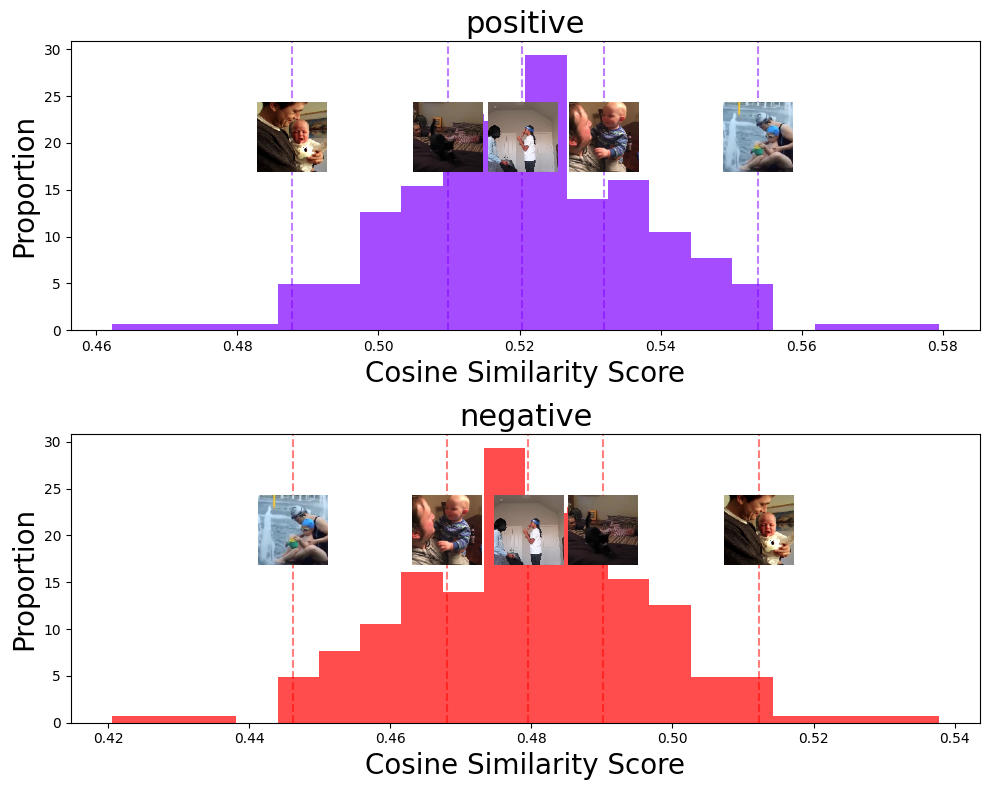

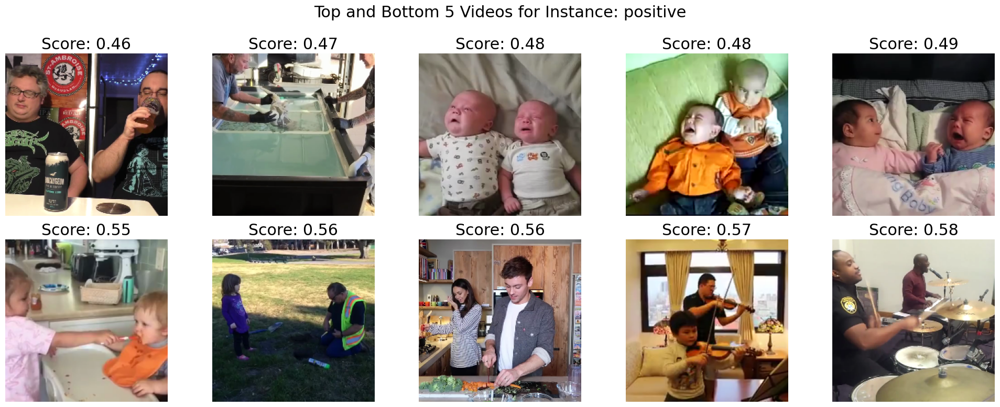

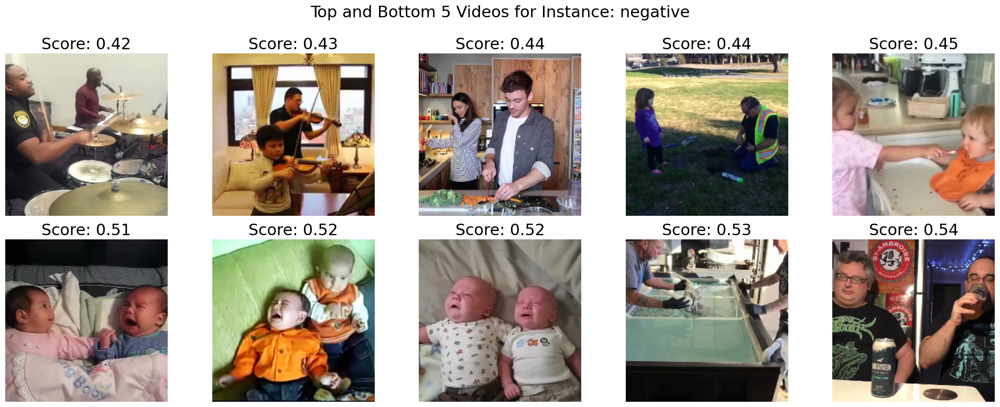

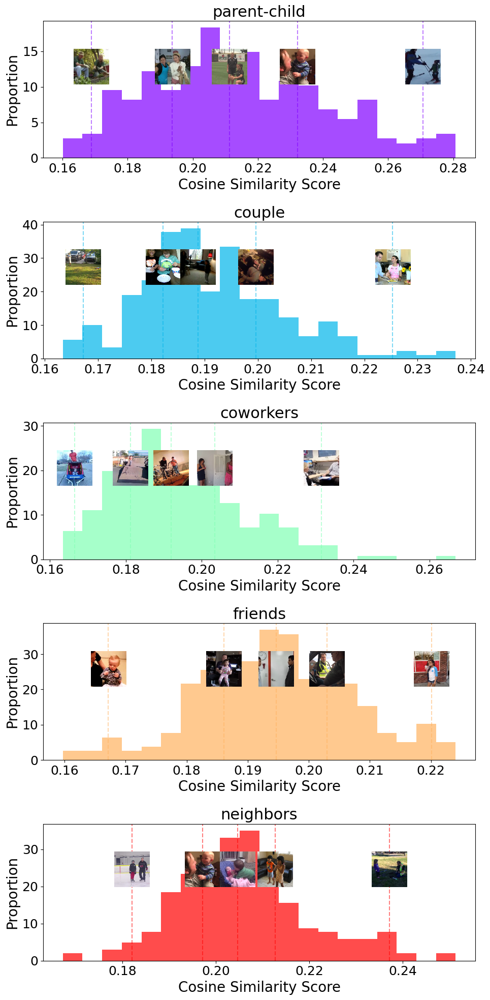

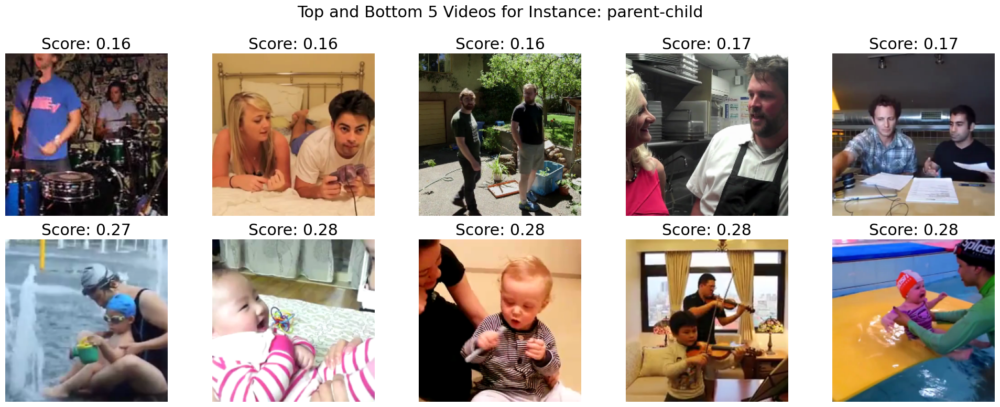

...

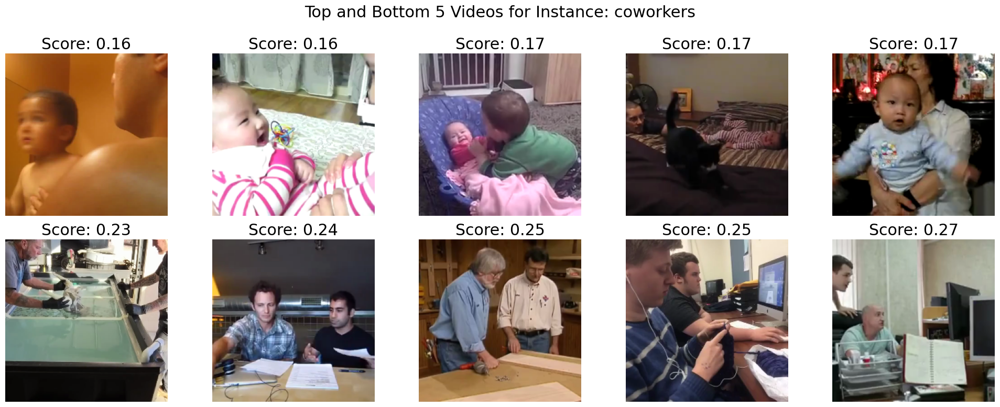

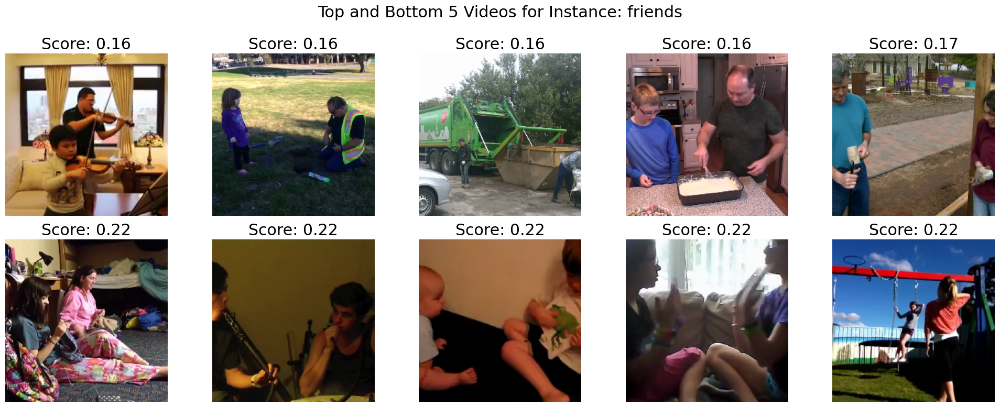

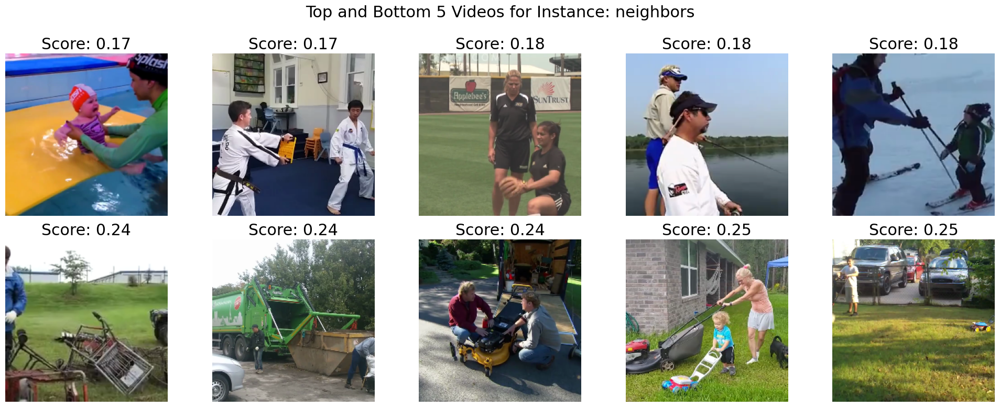

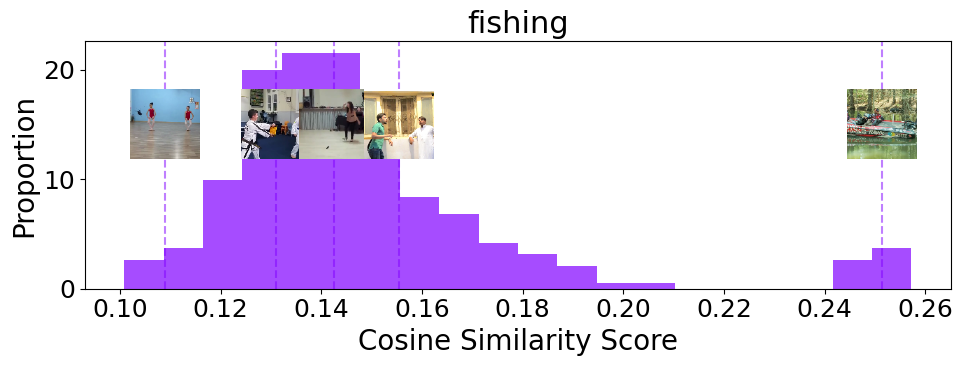

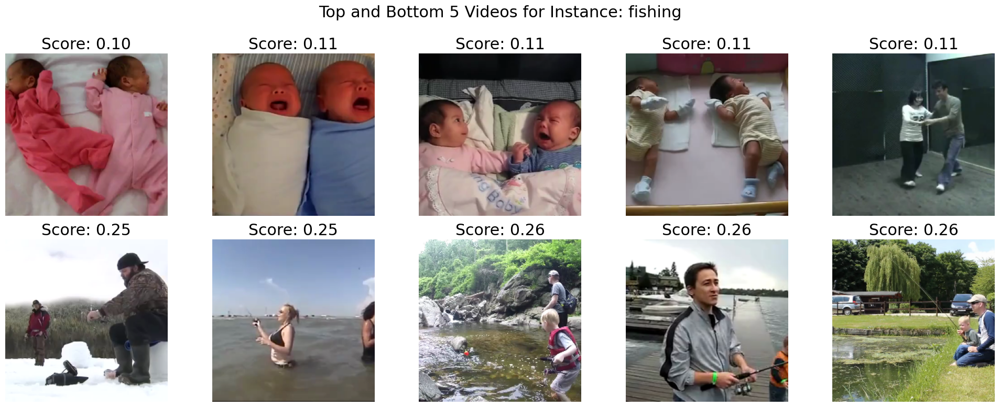

/opt/anaconda3/envs/MACSS/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/MACSS/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/opt/anaconda3/envs/MACSS/lib/python3.10/site-packages/umap/umap_.py:2462: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


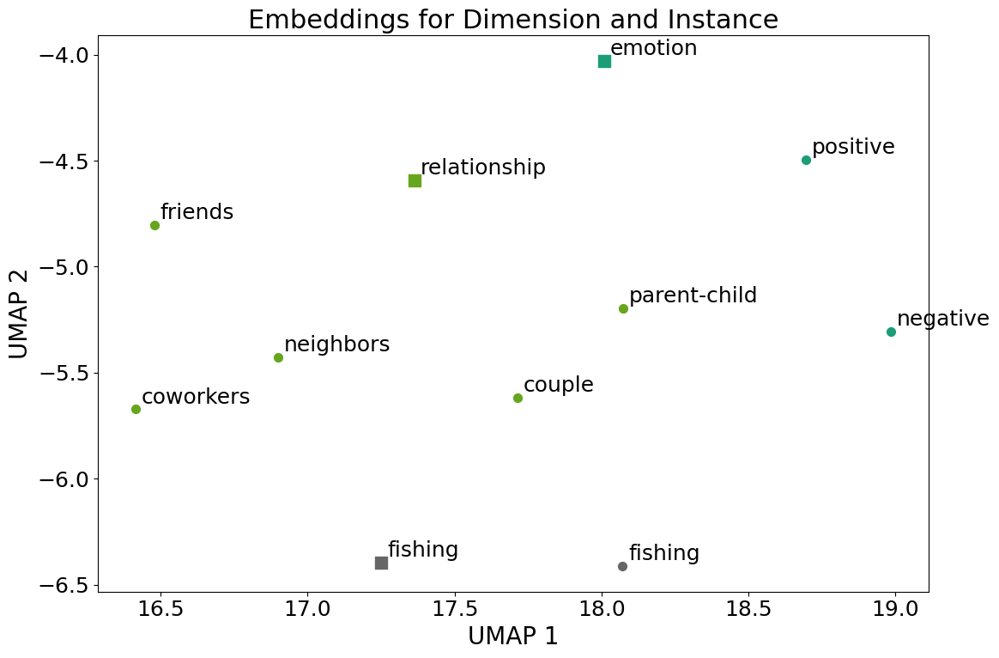

In [ ]:
#%% Example usage

dimension_dict = {
    'emotion': ['positive', 'negative'],
    'relationship': ['parent-child', 'couple', 'coworkers', 'friends','neighbors'],
    'fishing': ['fishing']
}
annotation_results = annotate_all_dimensions(dimension_dict, video_embedding_df)
print(annotation_results['fishing'].head())
print(annotation_results['emotion'].head())
# Plot extreme videos for each instance
for dimension, results_df in annotation_results.items():
    categories = results_df.columns[1:]  # Skip video_name column
    visualize_annotation_distributions(results_df)
    for instance in categories:
        show_extreme_videos(results_df, instance, video_dir)

# visualize dimension embeddings (text embeddings)
visualize_dimension_embeddings(dimension_dict)